
# Image Processing Project – Final Notebook

This notebook performs:

- Image preprocessing
- Harris corner detection
- Edge detection
- Shape detection
- Batch image processing
- Noise analysis


##Library Imports
The following Python libraries are imported for the project:

###cv2 (OpenCV)
Provides functions for image processing and computer vision tasks.
Used for reading images, converting color spaces, detecting edges, corners, and contours.

###numpy (NumPy)
Used for numerical operations on arrays and matrices, which are the core data structures for images.
Supports operations like adding noise, calculating corners, and array manipulations.

###matplotlib.pyplot
Used for visualizing images and plots.
Allows displaying original, processed, and annotated images in the notebook.

###glob
Used to retrieve file paths matching a specific pattern.
Helps in automatically loading multiple images from a folder for batch processing.

In [2]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob


## Image Upload

Upload the images that will be used for corner and shape detection.
This cell allows uploading images directly into Google Colab.
The uploaded images will be stored in `image_files` for later processing.


In [3]:
from google.colab import files

uploaded = files.upload()
image_files = list(uploaded.keys())

print("Images loaded:")
for f in image_files:
    print("-", f)


Saving building1.jpg to building1.jpg
Saving building2.jpg to building2.jpg
Saving building3.jpg to building3.jpg
Saving checker1.jpg to checker1.jpg
Saving checker2.jpg to checker2.jpg
Saving checker3.jpg to checker3.jpg
Saving grid1.jpg to grid1.jpg
Saving grid2.jpg to grid2.jpg
Saving grid3.jpg to grid3.jpg
Saving object1.jpg to object1.jpg
Saving shape1.jpg to shape1.jpg
Saving shape2.jpg to shape2.jpg
Saving shape3.jpg to shape3.jpg
Images loaded:
- building1.jpg
- building2.jpg
- building3.jpg
- checker1.jpg
- checker2.jpg
- checker3.jpg
- grid1.jpg
- grid2.jpg
- grid3.jpg
- object1.jpg
- shape1.jpg
- shape2.jpg
- shape3.jpg


In [4]:
print(image_files)


['building1.jpg', 'building2.jpg', 'building3.jpg', 'checker1.jpg', 'checker2.jpg', 'checker3.jpg', 'grid1.jpg', 'grid2.jpg', 'grid3.jpg', 'object1.jpg', 'shape1.jpg', 'shape2.jpg', 'shape3.jpg']


## Preprocessing
Preprocessing converts images to grayscale and applies Gaussian blur.
- Grayscale simplifies analysis for corner and edge detection.
- Gaussian blur reduces small noise and smooths the image.

In [5]:

def preprocess(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    return gray, blur


## Harris Corner Detection
This function detects corners using the Harris corner detection algorithm.
- Converts the grayscale image to float32
- Computes Harris response
- Dilates corners for better visibility

In [6]:

def detect_corners(gray):
    gray_float = np.float32(gray)
    harris = cv2.cornerHarris(gray_float, 2, 3, 0.04)
    harris = cv2.dilate(harris, None)
    return harris


## Shape Classification
This function classifies detected contours based on the number of sides:
- 3 sides → Triangle
- 4 sides → Quadrilateral
- More than 4 → Circle
- Other → Unknown


In [7]:

def classify_shape(contour):

    perimeter = cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, 0.04 * perimeter, True)

    sides = len(approx)

    if sides == 3:
        return "Triangle"
    elif sides == 4:
        return "Quadrilateral"
    elif sides > 4:
        return "Circle"
    else:
        return "Unknown"


## Image Analysis Pipeline
This function integrates the full image processing pipeline:
1. Preprocessing
2. Harris corner detection with visible circles
3. Edge detection using Canny
4. Contour detection and shape classification
5. Annotates images with corners and shapes
Returns:
- Original RGB image
- Image with corners
- Edge-detected image
- Image with annotated shapes
- Corner count
- Shape count

In [8]:

def analyze_image(filename):

    image = cv2.imread(filename)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gray, blur = preprocess(image)

    # Harris corners
    harris = detect_corners(gray)
    corner_img = image_rgb.copy()

    threshold = 0.01 * harris.max()
    y_coords, x_coords = np.where(harris > threshold)

    for x, y in zip(x_coords, y_coords):
        cv2.circle(corner_img, (x, y), 4, (0,255,0), 1)

    corner_count = len(x_coords)

    # Edges
    edges = cv2.Canny(blur, 80, 160)
    edges_display = cv2.convertScaleAbs(edges, alpha=2)

    # Shapes
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    shape_img = image_rgb.copy()
    shape_count = 0

    for contour in contours:

        area = cv2.contourArea(contour)

        if area > 500:

            shape = classify_shape(contour)
            shape_count += 1

            cv2.drawContours(shape_img, [contour], -1, (0,255,0), 2)

            x, y, w, h = cv2.boundingRect(contour)

            cv2.putText(shape_img, shape, (x, y-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6,
                        (255,0,0), 2)

    return image_rgb, corner_img, edges_display, shape_img, corner_count, shape_count


## Batch Image Processing
Processes all uploaded images automatically:
- Detects corners, edges, and shapes
- Displays results side by side
- Stores feature counts for summary


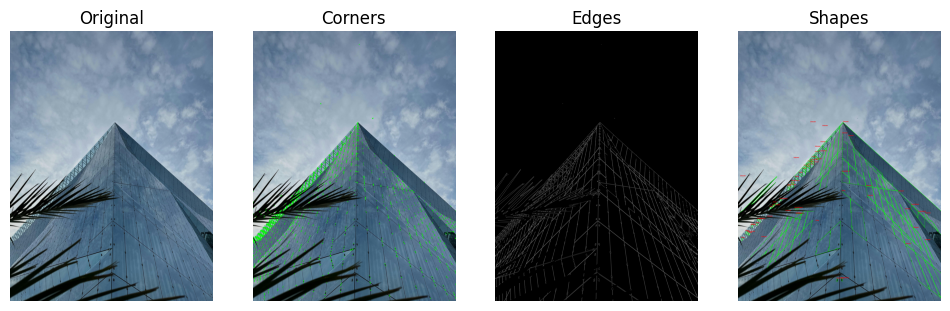

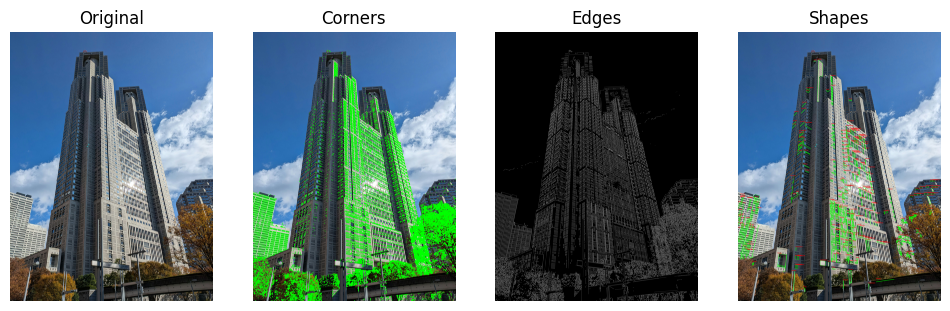

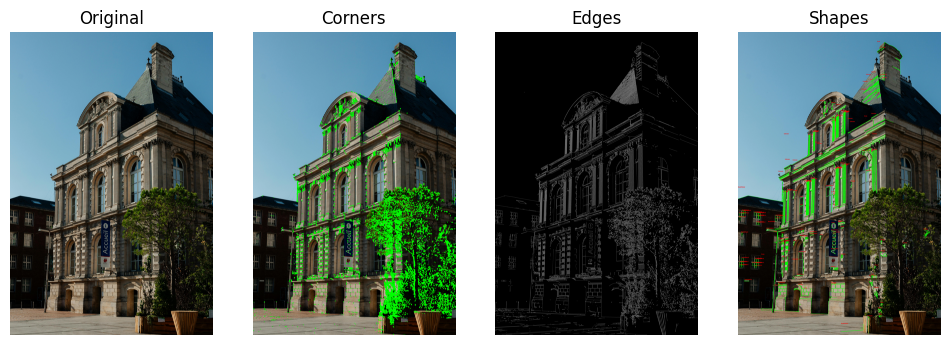

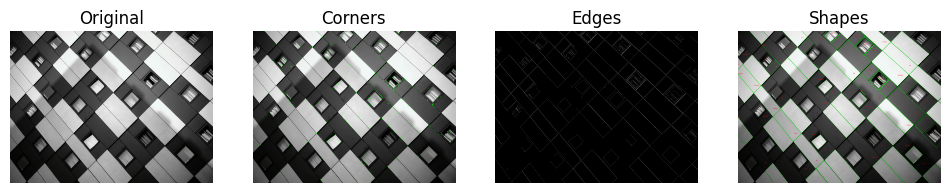

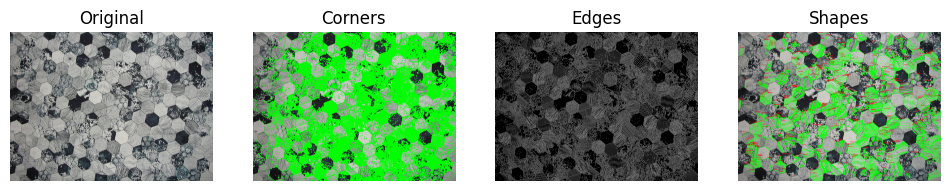

...

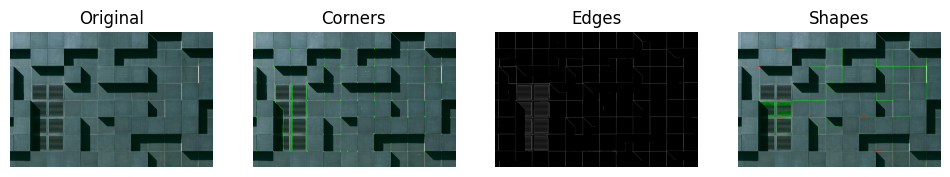

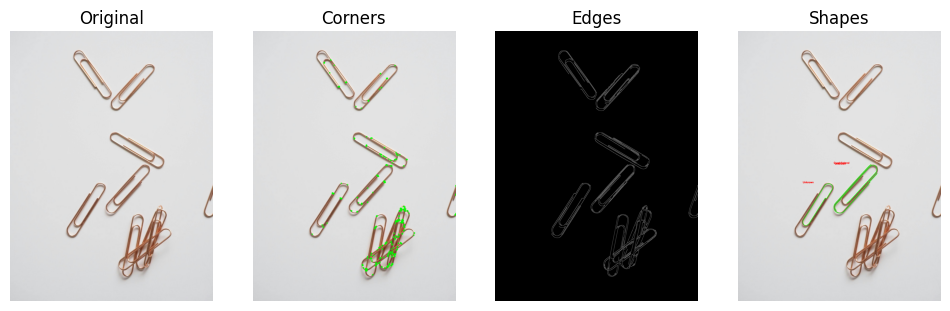

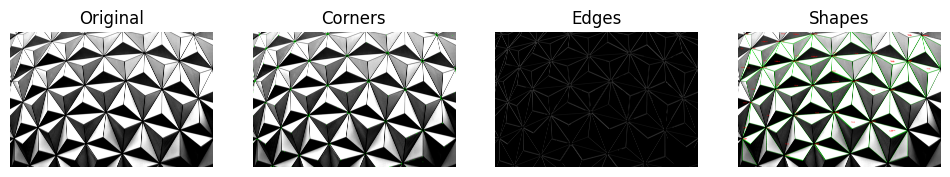

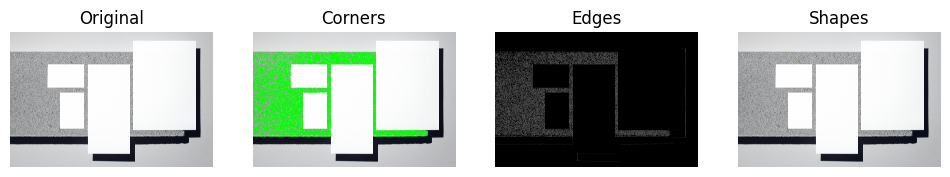

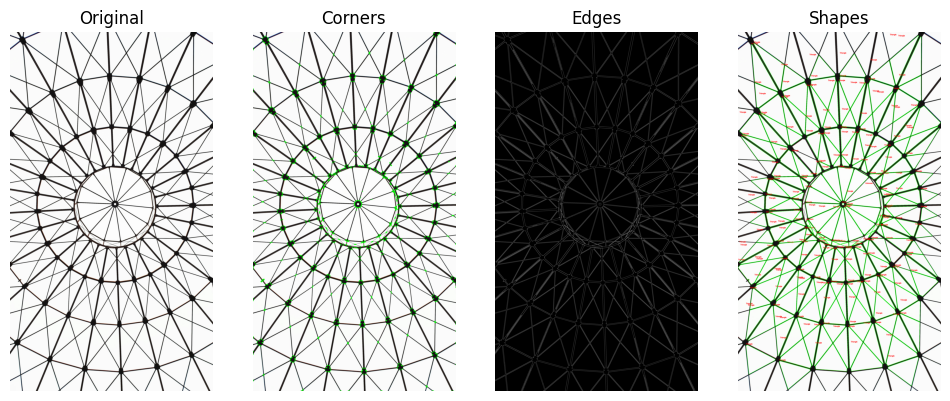

In [9]:
if len(image_files) == 0:
    print("⚠️ No images uploaded! Please upload images first.")
else:
    results = []

    for filename in image_files:
        original, corners, edges, shapes, corner_count, shape_count = analyze_image(filename)

        results.append((filename, corner_count, shape_count))

        plt.figure(figsize=(12,6))

        plt.subplot(1,4,1)
        plt.imshow(original)
        plt.title("Original")
        plt.axis('off')

        plt.subplot(1,4,2)
        plt.imshow(corners)
        plt.title("Corners")
        plt.axis('off')

        plt.subplot(1,4,3)
        plt.imshow(edges, cmap='gray')
        plt.title("Edges")
        plt.axis('off')

        plt.subplot(1,4,4)
        plt.imshow(shapes)
        plt.title("Shapes")
        plt.axis('off')

        plt.show()


##Feature Statistics
Prints a summary table of detected features for all images:
- Number of corners
- Number of shapes


In [10]:
print("=== Feature Summary ===\n")
for filename, corner_count, shape_count in results:
    print(f"{filename}")
    print("Corners detected:", corner_count)
    print("Shapes detected:", shape_count)
    print()


=== Feature Summary ===

building1.jpg
Corners detected: 33719
Shapes detected: 60

building2.jpg
Corners detected: 606738
Shapes detected: 280

building3.jpg
Corners detected: 381379
Shapes detected: 171

checker1.jpg
Corners detected: 14308
Shapes detected: 56

checker2.jpg
Corners detected: 1857223
Shapes detected: 558

checker3.jpg
Corners detected: 47157
Shapes detected: 900

grid1.jpg
Corners detected: 42603
Shapes detected: 88

grid2.jpg
Corners detected: 11426
Shapes detected: 29

grid3.jpg
Corners detected: 14236
Shapes detected: 9

object1.jpg
Corners detected: 4108
Shapes detected: 3

shape1.jpg
Corners detected: 6382
Shapes detected: 81

shape2.jpg
Corners detected: 996865
Shapes detected: 2

shape3.jpg
Corners detected: 24183
Shapes detected: 217



## Noise Robustness Testing (All Images)

Noise is added to every uploaded image to evaluate how the system behaves under degraded conditions.

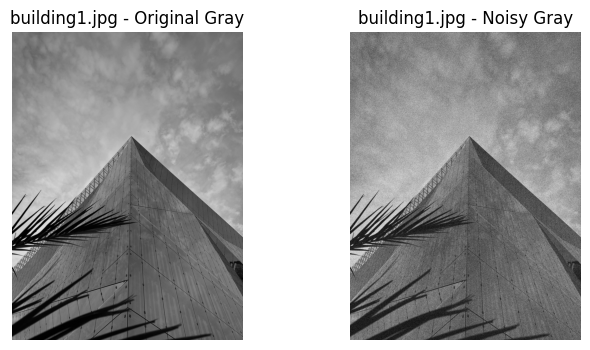

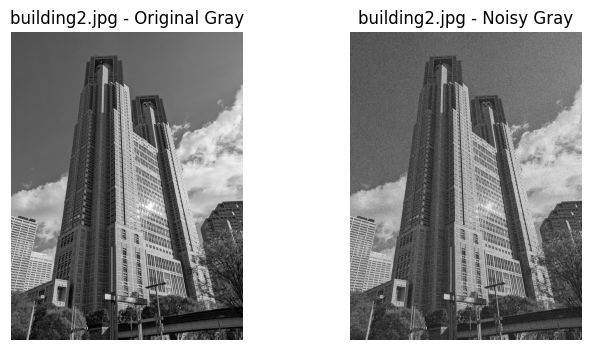

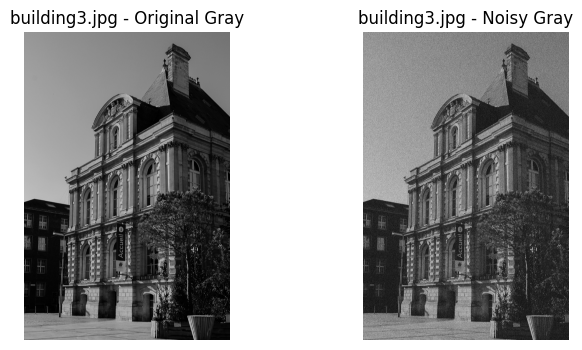

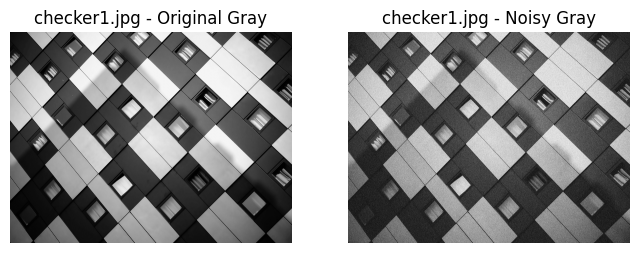

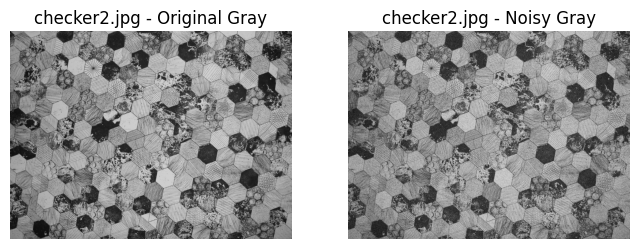

...

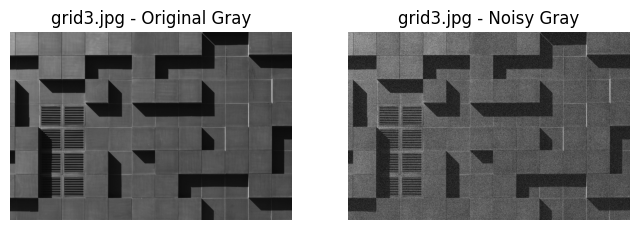

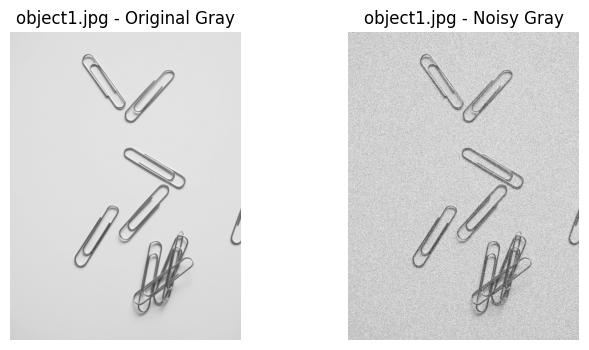

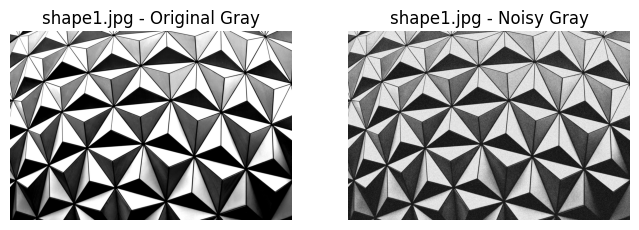

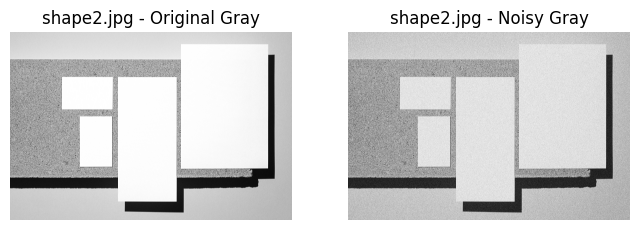

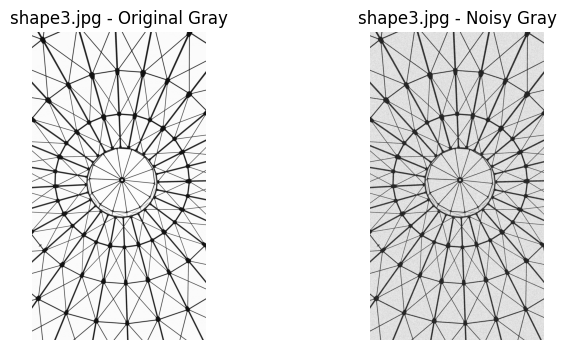

In [11]:
def add_noise(gray):
    noise = np.random.normal(0, 70, gray.shape)
    noisy = gray.astype(np.float32) + noise
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy

if len(image_files) == 0:
    print("⚠️ Please upload images first.")
else:
    for filename in image_files:

        image = cv2.imread(filename)
        gray, _ = preprocess(image)

        noisy = add_noise(gray)

        plt.figure(figsize=(8,4))

        plt.subplot(1,2,1)
        plt.imshow(gray, cmap='gray', vmin=0, vmax=255)
        plt.title(f"{filename} - Original Gray")
        plt.axis('off')

        plt.subplot(1,2,2)
        plt.imshow(noisy, cmap='gray', vmin=0, vmax=255)
        plt.title(f"{filename} - Noisy Gray")
        plt.axis('off')

        plt.show()


## Noise Robustness Testing with Multiple Noise Levels
Evaluates how the system performs under increasing Gaussian noise(noise intensity).
- Noise levels: low (σ=30), medium (σ=70), high (σ=120)
- Visualizes original and noisy images side by side

###Interpretation
Low sigma value(σ=30) → Noise is small → image looks close to original

Medium sigma value(σ=70) → Noise is noticeable → shapes slightly disturbed

High sigma value(σ=120) → Noise is strong → image may look “grainy” or distorted

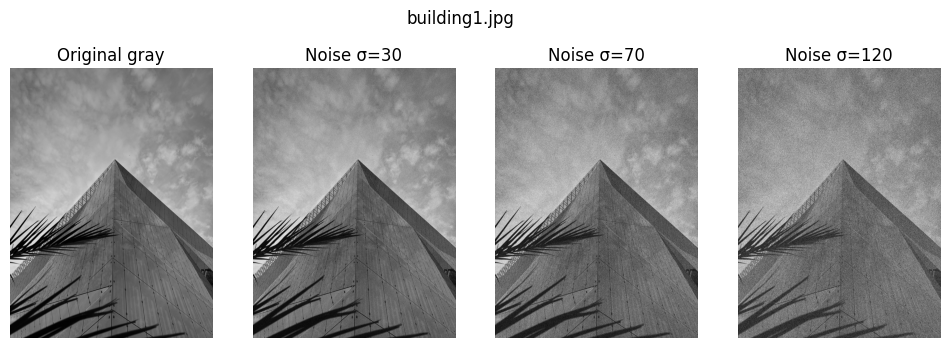

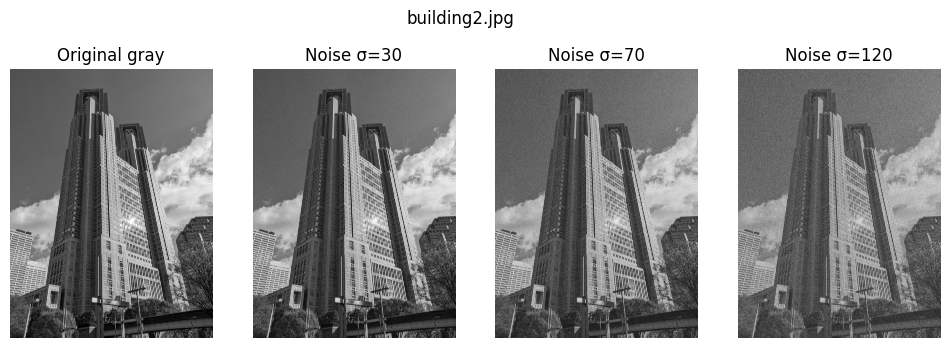

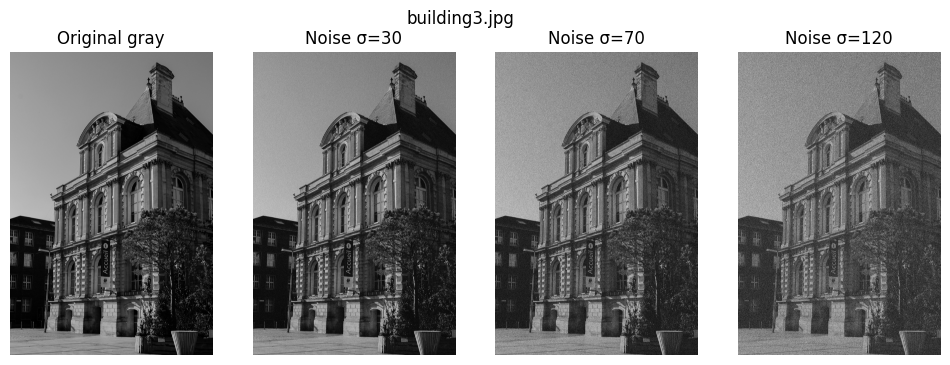

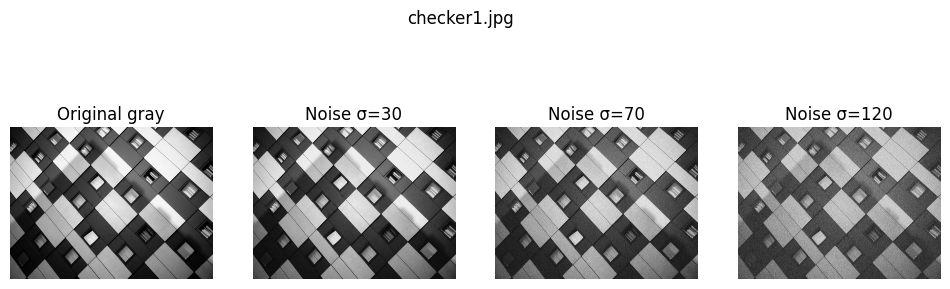

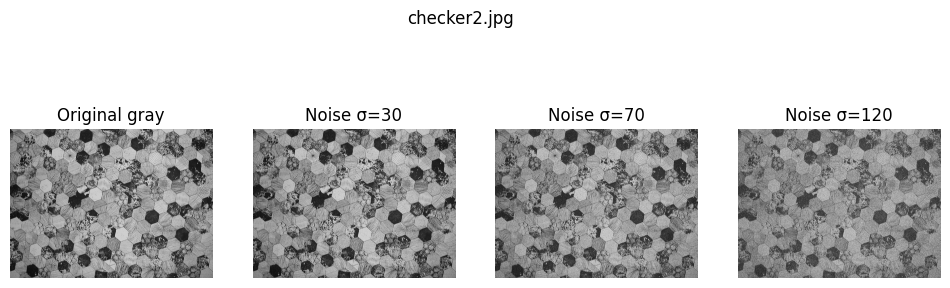

...

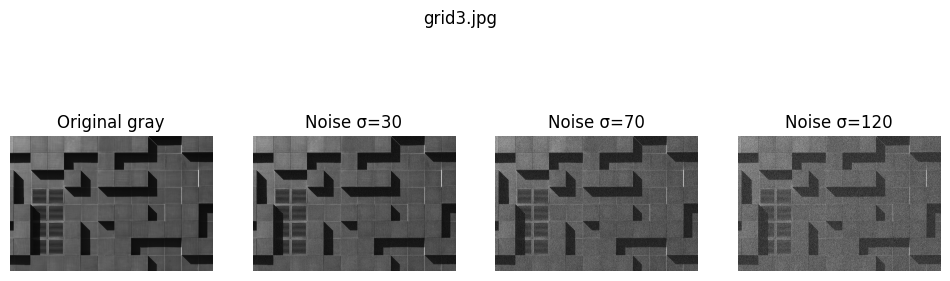

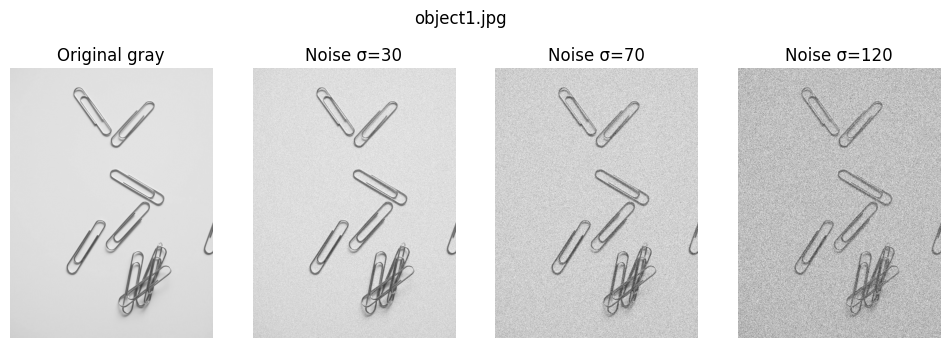

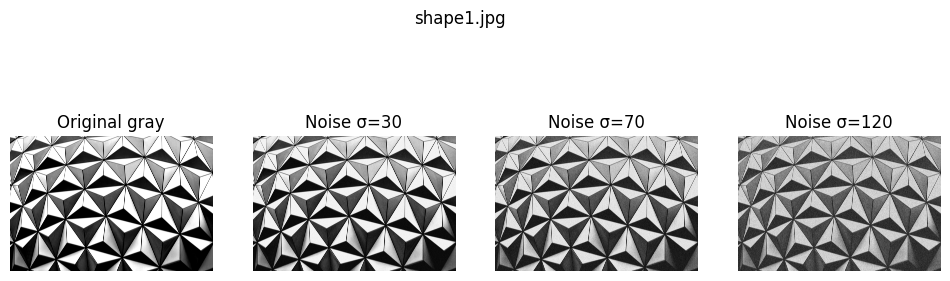

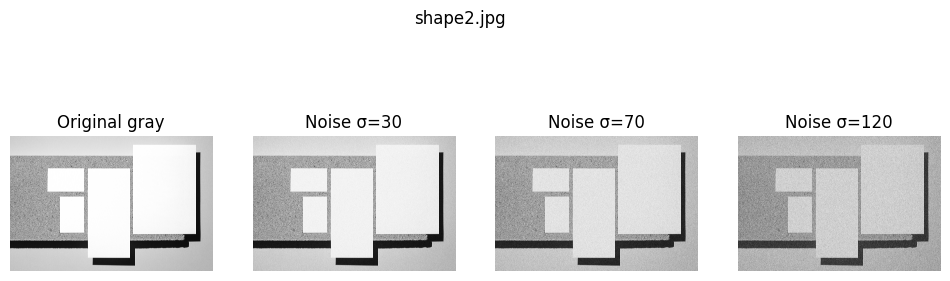

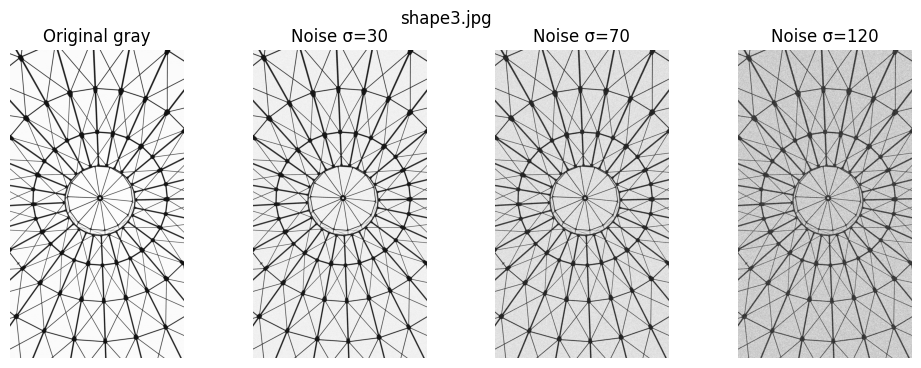

In [12]:
def add_noise(gray, strength):
    noise = np.random.normal(0, strength, gray.shape)
    noisy = gray.astype(np.float32) + noise
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy

noise_levels = [30, 70, 120]  # low, medium, high

for filename in image_files:

    image = cv2.imread(filename)
    gray, _ = preprocess(image)

    plt.figure(figsize=(12,4))

    plt.subplot(1, len(noise_levels)+1, 1)
    plt.imshow(gray, cmap='gray', vmin=0, vmax=255)
    plt.title("Original gray")
    plt.axis('off')

    for i, level in enumerate(noise_levels):

        noisy = add_noise(gray, level)

        plt.subplot(1, len(noise_levels)+1, i+2)
        plt.imshow(noisy, cmap='gray', vmin=0, vmax=255)
        plt.title(f"Noise σ={level}")
        plt.axis('off')

    plt.suptitle(filename)
    plt.show()


##Conclusion
This final section summarizes:
- The system successfully detects corners and shapes
- Preprocessing and noise handling are important
- The pipeline is robust to moderate noise
- The notebook is ready for batch image analysis and presentation
